# Natnael  Abule - 100058082
# Nidal Rifki -100053639

# Import Libraries and Read Files

In [3]:
# Import the necessary libraries 
import numpy as np
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
#use glob() to get a list of the csv files in the directory
files = glob('*.csv')
df = []
for file in files:
    part = pd.read_csv(file) #read each file
    df.append(part)
# Combine all DataFrames into one
combined_df = pd.concat(df, ignore_index=True)


##  Data Exploration and Preprocessing 


In [5]:
combined_df

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...
36728,3.6268,1028.5,93.200,3.1661,19.087,1037.0,541.59,109.08,10.411,10.99300,89.172
36729,4.1674,1028.6,94.036,3.1923,19.016,1037.6,542.28,108.79,10.344,11.14400,88.849
36730,5.4820,1028.5,95.219,3.3128,18.857,1038.0,543.48,107.81,10.462,11.41400,96.147
36731,5.8837,1028.7,94.200,3.9831,23.563,1076.9,550.11,131.41,11.771,3.31340,64.738


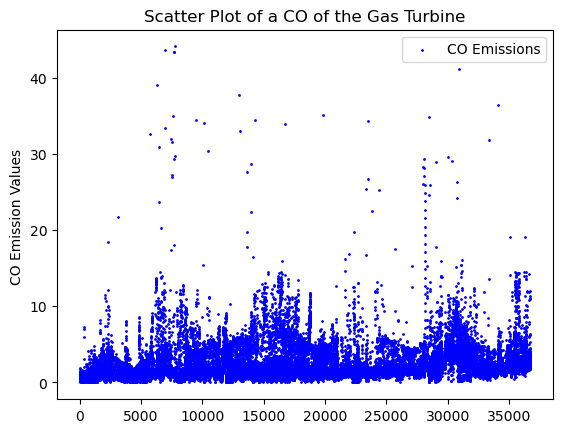

In [6]:
# Data Visualization
# create a scatter plot fot the outputs CO and NOx
x_axis = np.arange(len(combined_df['CO']))
plt.scatter(x=x_axis, y = combined_df['CO'], s=1, color='blue', label='CO Emissions')
plt.ylabel('CO Emission Values ')
plt.title('Scatter Plot of a CO of the Gas Turbine')
_=plt.legend()


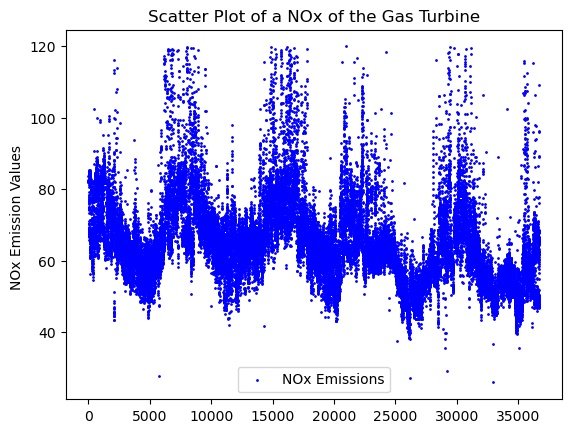

In [7]:
# create a scatter plot fot the outputs CO and NOx
x_axis = np.arange(len(combined_df['NOX'])) 
plt.scatter(x=x_axis, y = combined_df['NOX'], s=1, color='blue', label='NOx Emissions')
plt.ylabel('NOx Emission Values ')
plt.title('Scatter Plot of a NOx of the Gas Turbine')
_=plt.legend()


Based on the above plots, we can see a distinction between the values for CO and NOx emission amounts. This difference is important in using regression models. Now let's look at the nine input features as well. 

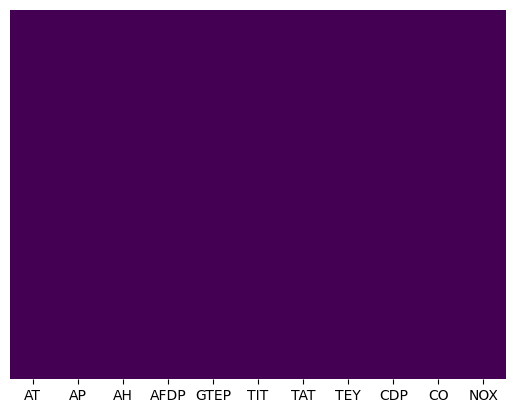

In [8]:
# Check for missing data
_=sns.heatmap(combined_df.isnull(),yticklabels=False,cbar=False,cmap='viridis')
# There are no missing values

<Axes: >

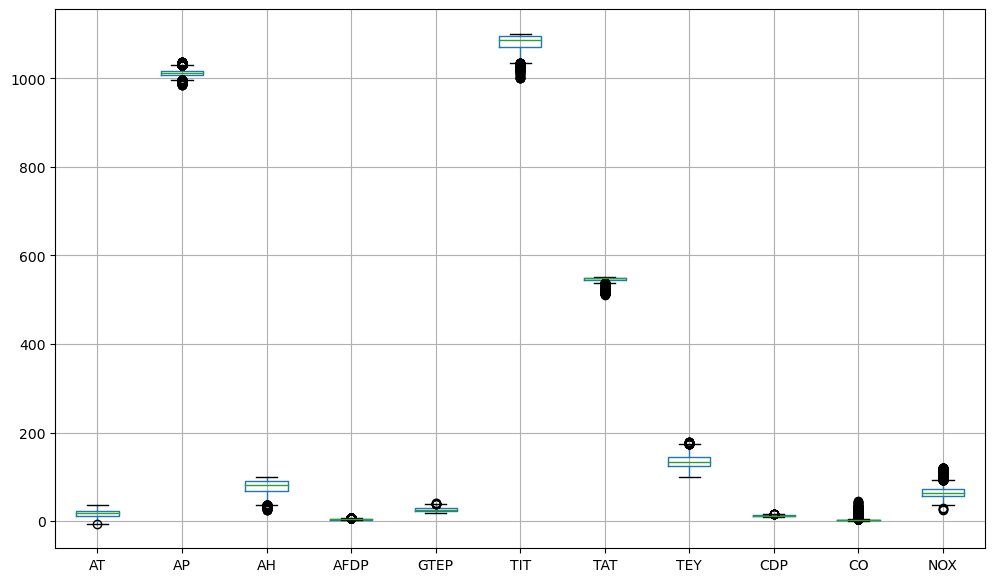

In [9]:
# Visualize the scale of each feature using a box plot
plt.figure(figsize=(12, 7))
combined_df.boxplot()

In [10]:
# Using correlation analysis to identify relationships between various values
data = combined_df.copy()
# Create a correlation matrix
corr_matrix = data.corr()

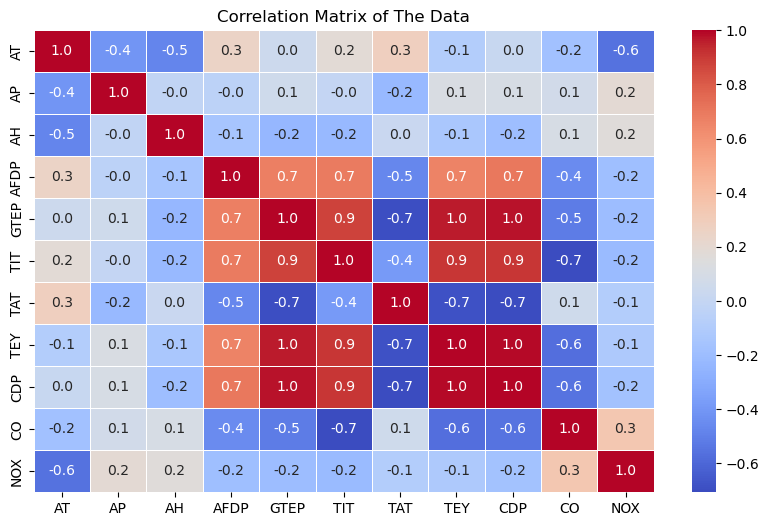

In [11]:
# plot a heatmap of the correlations for a better visualization
plt.figure(figsize=(10,6))
sns.heatmap(data=corr_matrix, annot=True, cmap='coolwarm', fmt='0.1f', linewidths=0.5)
plt.title('Correlation Matrix of The Data')
plt.show()
# closer values to 1 indicate positive relationship between pairs(eg.CDP&TEY,GTEP eith TEY&CDP )
# value -1 indicates negative relationship (eg output CO and CDP,TIT & TEY)
# value 0: little relationship (NOx andTAT, TEY)

In [12]:
# create an input features sataframe by dropping targets
in_features = combined_df.drop(['CO','NOX'], axis=1)
in_features

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910
...,...,...,...,...,...,...,...,...,...
36728,3.6268,1028.5,93.200,3.1661,19.087,1037.0,541.59,109.08,10.411
36729,4.1674,1028.6,94.036,3.1923,19.016,1037.6,542.28,108.79,10.344
36730,5.4820,1028.5,95.219,3.3128,18.857,1038.0,543.48,107.81,10.462
36731,5.8837,1028.7,94.200,3.9831,23.563,1076.9,550.11,131.41,11.771


In [13]:
# In order to apply effective techniques for the regression analysis, relevant features should be applied. 
# we ned to perform feature selection and feature extraction. To do this Principal Component Analysis(PCA) can be employed.
#PCA requires normalized data
# Normalize using Standard scaler
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
scaler = StandardScaler()
normalized = scaler.fit_transform(in_features)


In [14]:
pca = PCA(n_components=5)
in_feat_pca = pca.fit_transform(normalized)
in_feat_pca = pd.DataFrame(in_feat_pca, columns=['PCA1','PCA2','PCA3','PCA4','PCA5'], index=combined_df.index)
# Display the newly generated features using PCA
in_feat_pca


,PCA1,PCA2,PCA3,PCA4,PCA5
0,-0.467544,1.642396,0.234444,-0.690768,-0.836455
1,-0.495717,1.650028,0.162664,-0.686763,-0.868332
2,-0.414695,1.706285,0.131009,-0.727952,-0.904787
3,-0.451831,1.730721,0.092836,-0.730990,-0.898358
4,-0.503082,1.695947,0.058455,-0.657347,-0.882947
...,...,...,...,...,...
36728,-3.270243,3.334002,1.253906,0.259968,1.370368
36729,-3.323935,3.272363,1.219817,0.135365,1.390518
36730,-3.317608,3.097415,1.134066,-0.071618,1.487845
36731,-0.706432,2.490556,0.770154,-1.688083,0.261176


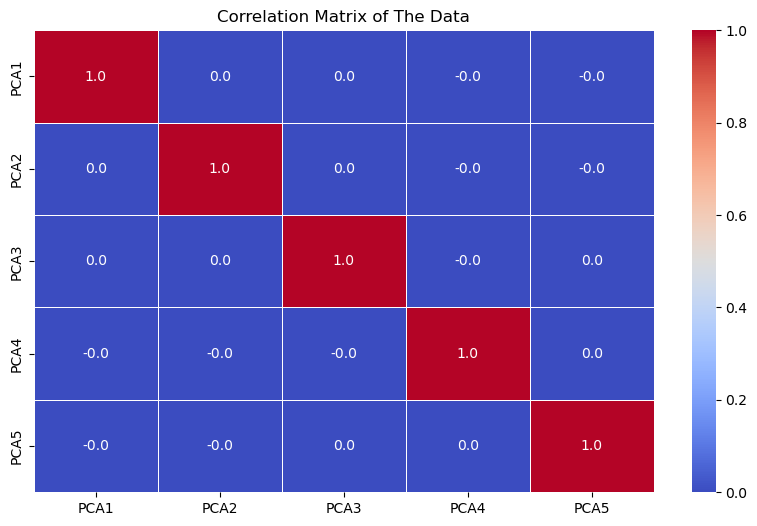

In [15]:
# compute the correlation matrix for the new features
corr_pca = in_feat_pca.corr()
# plot a heatmap of the correlations for a better visualization
plt.figure(figsize=(10,6))
sns.heatmap(data=corr_pca, annot=True, cmap='coolwarm', fmt='0.1f', linewidths=0.5)
plt.title('Correlation Matrix of The Data')
plt.show()
# closer values to 1 indicate positive relationship between pairs(eg.CDP&TEY,GTEP eith TEY&CDP )
# value -1 indicates negative relationship (eg output CO and CDP,TIT & TEY)
# value 0: little relationship (NOx andTAT, TEY)

## Model Selection & Evaluation

We will test various models on the raw data and cleaned data for both CO and NOx prediction

## Raw Data

### CO Prediction

### Simple Linear Regression

We are going to use k-fold cross validation to prevent overfitting and provide a more robust estimate of the model performance


In [16]:
# Now let's perform simple linear regression
# for CO prediction
X = combined_df.values[:,:-2] #independent
Y = combined_df.values[:,-2] #target
print(f'Shape of X {X.shape}')
print(f'Shape of Y {Y.shape}')
Y

Shape of X (36733, 9)
Shape of Y (36733,)


array([ 0.32663,  0.44784,  0.45144, ..., 11.414  ,  3.3134 , 11.981  ])

In [17]:
# split the data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X,Y, train_size=0.7, random_state=42)
print("X-train shape: ", x_train.shape)
print("y-train shape: ",y_train.shape)
print("X-test shape: ", x_test.shape)
print("y-test shape: ", y_test.shape)

X-train shape:  (25713, 9)
y-train shape:  (25713,)
X-test shape:  (11020, 9)
y-test shape:  (11020,)


In [18]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
from sklearn.model_selection import cross_val_score, KFold
folds =5 # for a 5-fold validation
lr = LinearRegression()

kf = KFold(n_splits=folds, shuffle=True, random_state=42)
lr.fit(X,Y) # train the model
# compute metrics
r2 = cross_val_score(lr, X, Y, cv=kf, scoring='r2')
mse = cross_val_score(lr, X, Y, cv=kf, scoring='neg_mean_squared_error')

print("Performance:")
print(f"Average Mean Squared Error: {abs(np.mean(mse))}")
print(f"Average R-squared: {abs(np.mean(r2))}")


Performance:
Average Mean Squared Error: 2.237459199308197
Average R-squared: 0.5646861361628721


In [19]:
y_pred = lr.predict(x_test) # make some predictions

In [20]:
# The following is to illustrate errors
y_test_list = list(y_test)
for i in range(y_pred.shape[0]):
    if (y_test_list[i]) != y_pred[i]:
       print("Error in testing instance( sample)", i," actual = ",y_test_list[i], "predicted = ", y_pred[i])

Error in testing instance( sample) 0  actual =  0.87832 predicted =  0.8689919984791885
Error in testing instance( sample) 1  actual =  0.44446 predicted =  1.307087062042612
Error in testing instance( sample) 2  actual =  5.299 predicted =  5.159401581976567
Error in testing instance( sample) 3  actual =  0.13127 predicted =  1.5723109011764507
Error in testing instance( sample) 4  actual =  1.79 predicted =  2.1508232489100862
Error in testing instance( sample) 5  actual =  1.6633 predicted =  1.359385359812137
Error in testing instance( sample) 6  actual =  1.4059 predicted =  0.9585795412726554
Error in testing instance( sample) 7  actual =  2.4402 predicted =  2.2044618917578163
Error in testing instance( sample) 8  actual =  2.9008 predicted =  1.6115472959317145
Error in testing instance( sample) 9  actual =  0.83337 predicted =  1.706144315240465
Error in testing instance( sample) 10  actual =  3.5622 predicted =  2.5593628685959686
Error in testing instance( sample) 11  actual

In [212]:
#Report the MSE and R2 of the simple linear regression
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Performance:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

print("Testing set score: {:.2f}".format(lr.score(x_train, y_train)))


Performance:
Mean Squared Error: 2.118282294172993
R-squared: 0.5760832215839023
Testing set score: 0.56


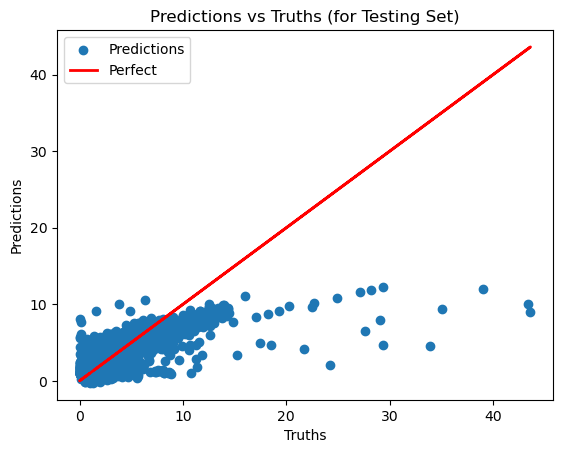

In [21]:
# Create a scatter plot to show the line fit with respect to the points
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Ridge Regression


In [23]:
# Using ridge model to penalize weights
from sklearn.linear_model import Ridge
# we obtained the best performance for al = 0.01
al=0.01
ridge= Ridge(alpha=0.01)
ridge.fit(x_train, y_train)# train the model
y_pred = ridge.predict(x_test)
# compute metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Performance for alpha =" + str(al))
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")
print("Testing set score: {:.2f}".format(ridge.score(x_train, y_train)))


Performance for alpha =0.01
Mean Squared Error: 2.1203112013760115
R-squared: 0.5756771908071854
Testing set score: 0.56


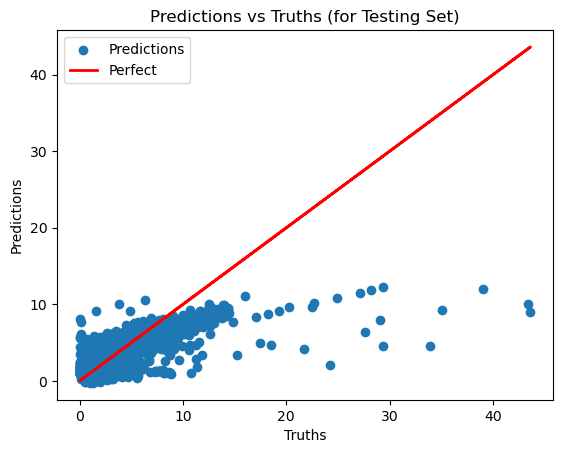

In [24]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Lasso Regression

In [26]:
# USe lasso regression to penalize weights individually
from sklearn.linear_model import Lasso
ridge= Lasso(max_iter=2000, alpha=0.001)
# train the model
ridge.fit(x_train, y_train)
y_pred = ridge.predict(x_test) # perform prediction
# compute metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Performance-------------:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")


Performance-------------:
Mean Squared Error: 2.1208604580414714
R-squared: 0.5755672719749383


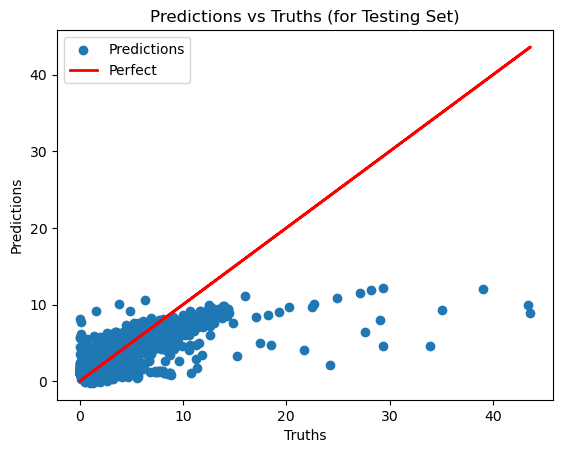

In [27]:
# # Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### KNN Classifier


In [218]:
from sklearn.neighbors import KNeighborsRegressor
#Parameter tuning for k
for i in range(3,12,2):
    knn = KNeighborsRegressor(n_neighbors=i)
    # train the model
    knn.fit(x_train, y_train)
    # perform prediction
    y_pred = knn.predict(x_test)
    # compute metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-----"+ str(i) +"-----Neighbours:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("----------------------------")
# K=9 gives maximum r2 score

Performance-----3-----Neighbours:
Mean Squared Error: 1.4732283656158793
R-squared: 0.7051732791512
----------------------------
Performance-----5-----Neighbours:
Mean Squared Error: 1.4062389700589
R-squared: 0.7185793907118141
----------------------------
Performance-----7-----Neighbours:
Mean Squared Error: 1.398999707833764
R-squared: 0.7200281328030032
----------------------------
Performance-----9-----Neighbours:
Mean Squared Error: 1.3841472115222793
R-squared: 0.7230004573157092
----------------------------
Performance-----11-----Neighbours:
Mean Squared Error: 1.418259702393605
R-squared: 0.7161737669951129
----------------------------


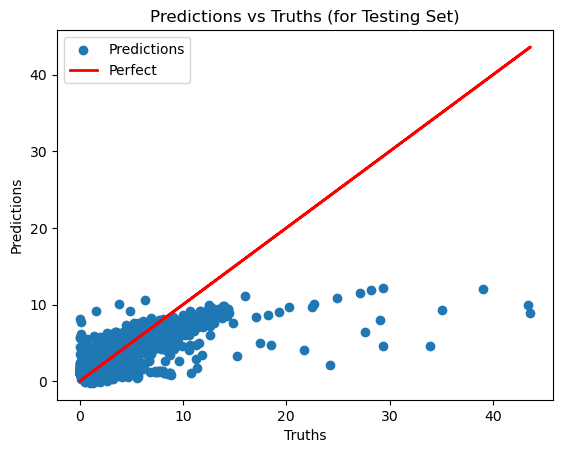

In [28]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Decision Tree 

In [220]:
from sklearn.tree import DecisionTreeRegressor
model_acc = []
for depth in range(10,30,1):
    dtree_model_test  = DecisionTreeRegressor(max_depth=depth)
    dtree_model_test.fit(x_train, y_train) # train the model
    # perform prediction
    y_pred = dtree_model_test.predict(x_test)
    # compute metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-----"+ str(depth) +"-----Depth:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("----------------------------")
# optimum depth is 12

Performance-----10-----Depth:
Mean Squared Error: 2.036128201420325
R-squared: 0.5925241362010001
----------------------------
Performance-----11-----Depth:
Mean Squared Error: 2.0025562605732525
R-squared: 0.5992426500875655
----------------------------
Performance-----12-----Depth:
Mean Squared Error: 1.717330560281654
R-squared: 0.6563228420533374
----------------------------
Performance-----13-----Depth:
Mean Squared Error: 2.117775558534904
R-squared: 0.5761846309851886
----------------------------
Performance-----14-----Depth:
Mean Squared Error: 2.0253980405898586
R-squared: 0.5946714870161631
----------------------------
Performance-----15-----Depth:
Mean Squared Error: 2.1719001119275574
R-squared: 0.565353068841399
----------------------------
Performance-----16-----Depth:
Mean Squared Error: 2.0381214836358557
R-squared: 0.5921252347998005
----------------------------
Performance-----17-----Depth:
Mean Squared Error: 2.245894738564873
R-squared: 0.550545050179071
-----------

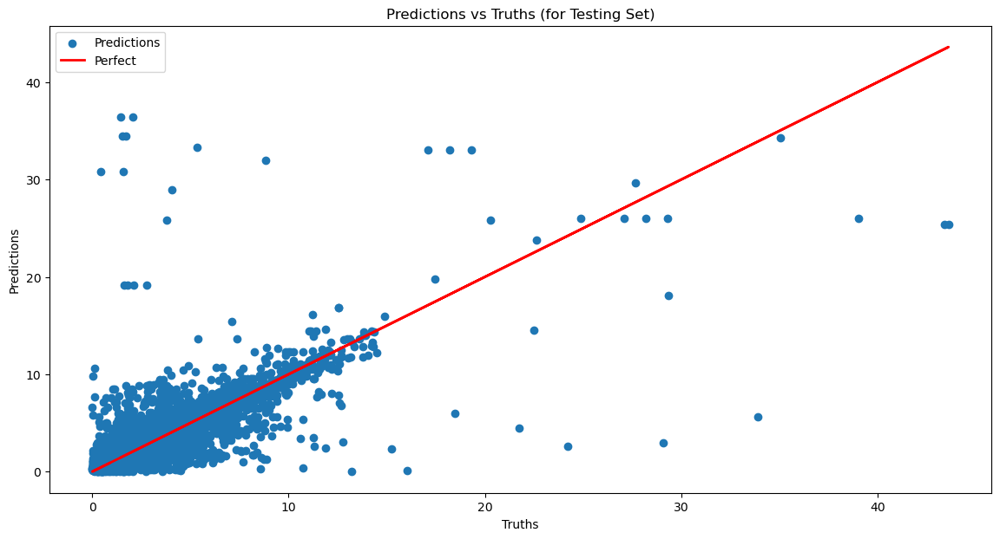

In [221]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Random forest

In [222]:
from sklearn.ensemble import RandomForestRegressor
model_acc = []
for estimator in range(20,50,5): # optimize estimator
    dtree_model_test  = RandomForestRegressor(n_estimators=estimator)
    dtree_model_test.fit(x_train, y_train) # train the model

    y_pred = dtree_model_test.predict(x_test) # perform prediction
    # compute metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-----"+ str(estimator) +"-----estimators:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("----------------------------")

Performance-----20-----estimators:
Mean Squared Error: 1.1352143391502696
R-squared: 0.7728176236056286
----------------------------
Performance-----25-----estimators:
Mean Squared Error: 1.0940596659257789
R-squared: 0.781053615823514
----------------------------
Performance-----30-----estimators:
Mean Squared Error: 1.1474774876518796
R-squared: 0.7703634868645808
----------------------------
Performance-----35-----estimators:
Mean Squared Error: 1.104249934256808
R-squared: 0.779014309856614
----------------------------
Performance-----40-----estimators:
Mean Squared Error: 1.110862379325653
R-squared: 0.7776910082273888
----------------------------
Performance-----45-----estimators:
Mean Squared Error: 1.1519813005980188
R-squared: 0.7694621707935511
----------------------------


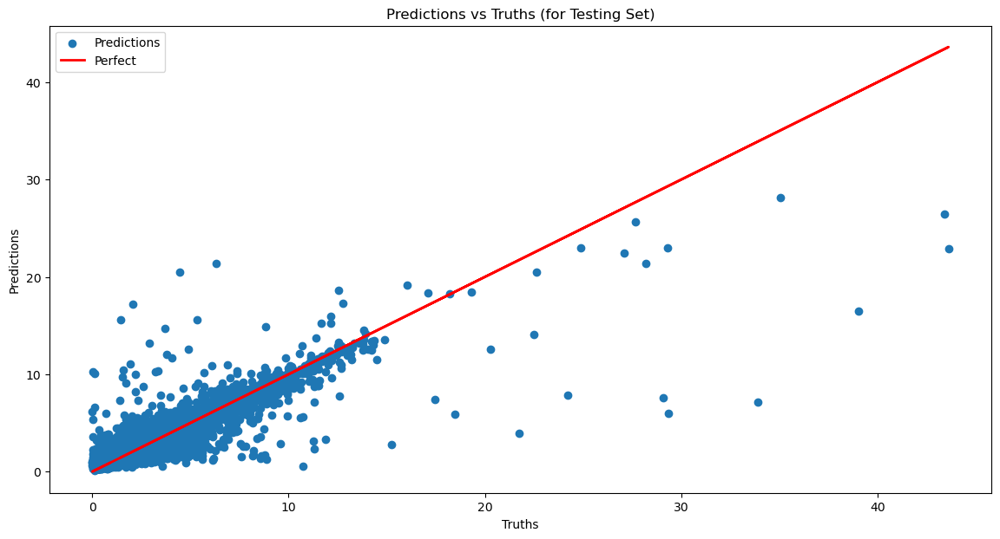

In [223]:
# # Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### CatboostRegressor

In [224]:
from catboost import CatBoostRegressor
#Using optimum regression parameters for catboost
cbr = CatBoostRegressor(iterations=2000, depth = 8, learning_rate= 0.1, loss_function= 'RMSE')
kf = KFold(n_splits=folds, shuffle=True, random_state=42)
# train the model
cbr.fit(X,Y)
# compute metrics

r2 = cross_val_score(cbr, X, Y, cv=kf, scoring='r2')
mse = cross_val_score(cbr, X, Y, cv=kf, scoring='neg_mean_squared_error')
print(f"Average Mean Squared Error: {np.mean(mse)}")
print(f"Average R-squared: {abs(np.mean(r2))}")
print("----------------------------")

0:	learn: 2.1222922	total: 18.6ms	remaining: 37.3s
1:	learn: 1.9965239	total: 36.8ms	remaining: 36.8s
2:	learn: 1.8875757	total: 54.5ms	remaining: 36.3s
3:	learn: 1.7893675	total: 69.6ms	remaining: 34.8s
4:	learn: 1.7058043	total: 86.9ms	remaining: 34.7s
5:	learn: 1.6326374	total: 118ms	remaining: 39.1s
6:	learn: 1.5677035	total: 144ms	remaining: 41s
7:	learn: 1.5118571	total: 167ms	remaining: 41.5s
8:	learn: 1.4629821	total: 185ms	remaining: 40.9s
9:	learn: 1.4203241	total: 202ms	remaining: 40.2s
10:	learn: 1.3811338	total: 223ms	remaining: 40.4s
11:	learn: 1.3492966	total: 239ms	remaining: 39.5s
12:	learn: 1.3171420	total: 254ms	remaining: 38.8s
13:	learn: 1.2918175	total: 268ms	remaining: 38s
14:	learn: 1.2674111	total: 284ms	remaining: 37.5s
15:	learn: 1.2482034	total: 298ms	remaining: 37s
16:	learn: 1.2309299	total: 313ms	remaining: 36.6s
17:	learn: 1.2153217	total: 328ms	remaining: 36.2s
18:	learn: 1.2009097	total: 344ms	remaining: 35.8s
19:	learn: 1.1895989	total: 359ms	remainin

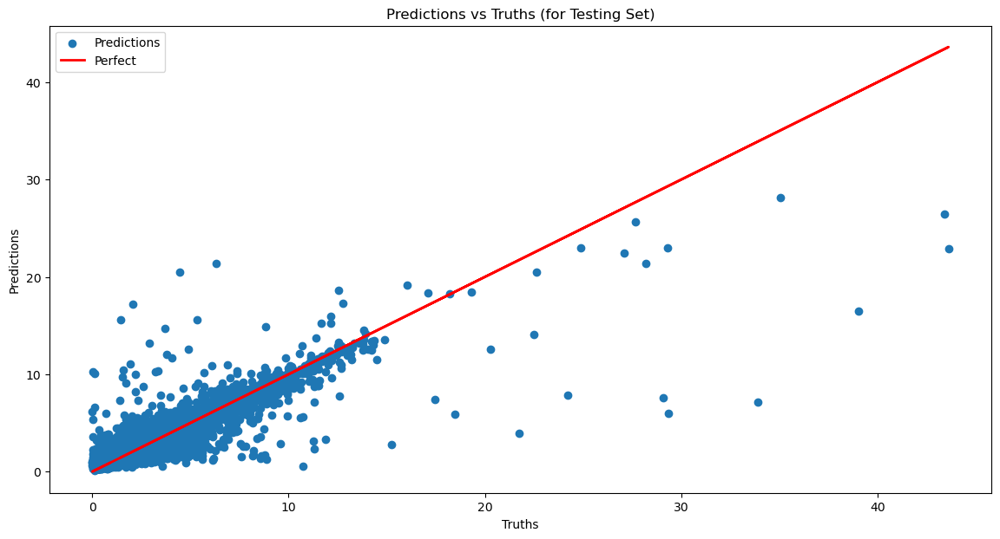

In [225]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### NOx Prediction

Continue building and validating the models for NOx prediction

### Simple Linear Regression

We are going to use k-fold cross validation to prevent overfitting and provide a more robust estimate of the model performance


In [226]:
# Now let's perform simple linear regression
# for CO prediction
X = combined_df.values[:,:-2] #independent
Y = combined_df.values[:,-1] #target
print(f'Shape of X {X.shape}')
print(f'Shape of Y {Y.shape}')

Shape of X (36733, 9)
Shape of Y (36733,)


In [227]:
# split the data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X,Y, train_size=0.7, random_state=42)
print("X-train shape: ", x_train.shape)
print("y-train shape: ",y_train.shape)
print("X-test shape: ", x_test.shape)
print("y-test shape: ", y_test.shape)

X-train shape:  (25713, 9)
y-train shape:  (25713,)
X-test shape:  (11020, 9)
y-test shape:  (11020,)


In [228]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
from sklearn.model_selection import cross_val_score, KFold
folds =5 # for a 5-fold validation
lr = LinearRegression()

kf = KFold(n_splits=folds, shuffle=True, random_state=42)
lr.fit(X,Y) # train the model
# compute metrics
r2 = cross_val_score(lr, X, Y, cv=kf, scoring='r2')
rmse = cross_val_score(lr, X, Y, cv=kf, scoring='neg_mean_squared_error')

print("Performance:")
print(f"Average Mean Squared Error: {np.mean(rmse)}")
print(f"Average R-squared: {abs(np.mean(r2))}")


Performance:
Average Mean Squared Error: -65.81254643637148
Average R-squared: 0.5172669280401344


In [229]:
y_pred = lr.predict(x_test) 

In [230]:
y_test_list = list(y_test)
for i in range(y_pred.shape[0]):
    if (y_test_list[i]) != y_pred[i]:
       print("Error in testing instance( sample)", i," actual = ",y_test_list[i], "predicted = ", y_pred[i])

Error in testing instance( sample) 0  actual =  60.048 predicted =  63.60247406889843
Error in testing instance( sample) 1  actual =  61.635 predicted =  61.2344512943873
Error in testing instance( sample) 2  actual =  69.073 predicted =  75.02708561364429
Error in testing instance( sample) 3  actual =  61.352 predicted =  68.2756975034948
Error in testing instance( sample) 4  actual =  50.45 predicted =  59.23371260999713
Error in testing instance( sample) 5  actual =  77.274 predicted =  73.59058523997223
Error in testing instance( sample) 6  actual =  65.693 predicted =  63.88886216737032
Error in testing instance( sample) 7  actual =  50.775 predicted =  52.86924958028348
Error in testing instance( sample) 8  actual =  58.405 predicted =  68.33296674264133
Error in testing instance( sample) 9  actual =  72.056 predicted =  69.7525518732393
Error in testing instance( sample) 10  actual =  71.785 predicted =  69.7680731605029
Error in testing instance( sample) 11  actual =  52.41 pre

In [231]:
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Performance:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

print("Testing set score: {:.2f}".format(lr.score(x_train, y_train)))


Performance:
Mean Squared Error: 65.55819624651797
R-squared: 0.5031428948966772
Testing set score: 0.52


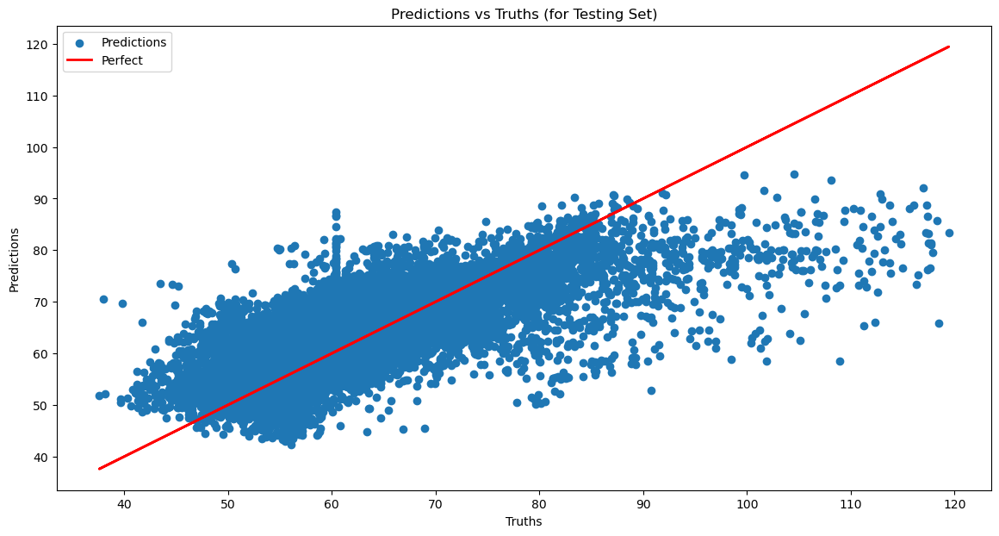

In [232]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Ridge Regression


In [233]:
from sklearn.linear_model import Ridge
alphas = [0.0001, 0.001, 0.01]
ridge_models = []
for al in alphas:
    ridge= Ridge(alpha=al)
    ridge.fit(x_train, y_train) 
# train the model
    y_pred = ridge.predict(x_test)# perform prediction
# compute metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance for alpha =" + str(al))
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    ridge_models.append(ridge)
print("Testing set score: {:.2f}".format(ridge.score(x_train, y_train)))


Performance for alpha =0.0001
Mean Squared Error: 65.65818524142351
R-squared: 0.5023850912139134
Performance for alpha =0.001
Mean Squared Error: 65.65818499114224
R-squared: 0.5023850931107628
Performance for alpha =0.01
Mean Squared Error: 65.65818248862148
R-squared: 0.5023851120770446
Testing set score: 0.52


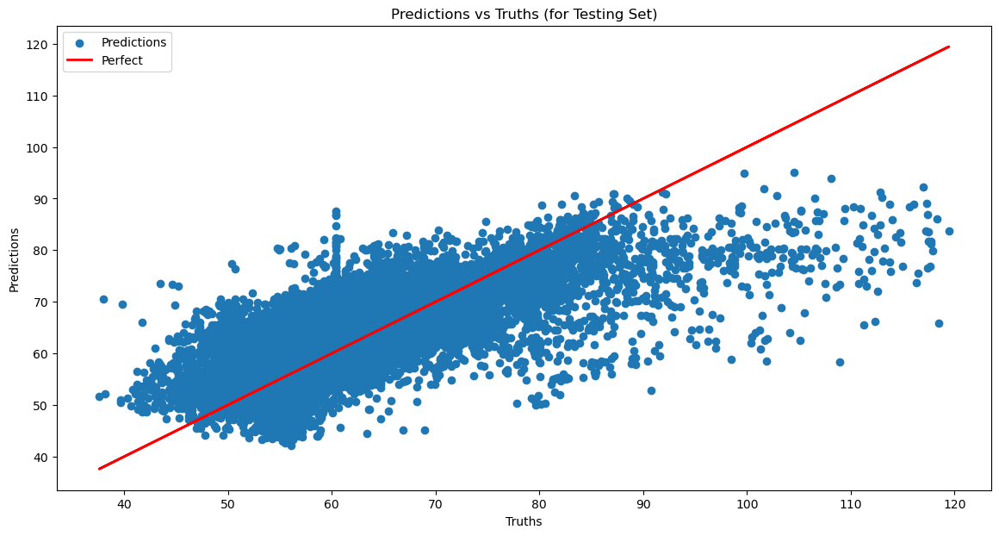

In [234]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Lasso Regression

In [29]:
from sklearn.linear_model import Lasso
alphas = [0.0001, 0.001, 0.01]
lasso_m = []
for al in alphas:
    lasso= Lasso(max_iter=2000, alpha=al)
    lasso.fit(x_train, y_train)# train the model

    y_pred = lasso.predict(x_test)# perform prediction
# compute metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-------------:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    lasso_m.append(lasso)
print("Testing set score: {:.2f}".format(lasso.score(x_train, y_train)))

c:\Users\Natnael Abule\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.800e+01, tolerance: 1.330e+01
  model = cd_fast.enet_coordinate_descent(


Performance-------------:
Mean Squared Error: 2.1203437887380017
R-squared: 0.5756706693300668
Performance-------------:
Mean Squared Error: 2.1208604580414714
R-squared: 0.5755672719749383
Performance-------------:
Mean Squared Error: 2.1407976438205565
R-squared: 0.571577384701933
Testing set score: 0.55


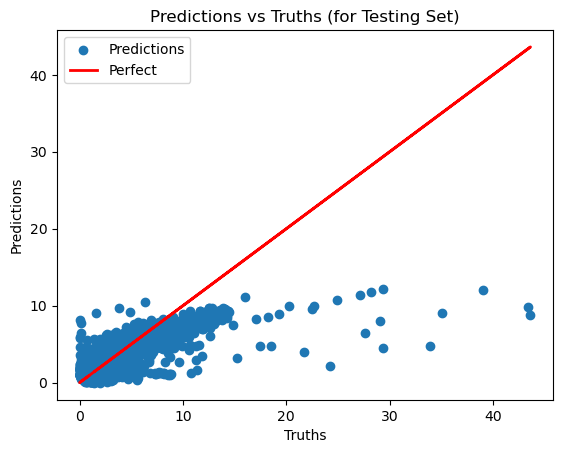

In [30]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### KNN Classifier


In [237]:
from sklearn.neighbors import KNeighborsRegressor
for i in range(3,12,2):
    knn = KNeighborsRegressor(n_neighbors=i)
    knn.fit(x_train, y_train)# train the model

    y_pred = knn.predict(x_test) # perform prediction
# compute metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-----"+ str(i) +"-----Neighbours:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("----------------------------")

# optimal K is 3

Performance-----3-----Neighbours:
Mean Squared Error: 28.01877037507562
R-squared: 0.7876493568437032
----------------------------
Performance-----5-----Neighbours:
Mean Squared Error: 28.126178636373865
R-squared: 0.7868353234988541
----------------------------
Performance-----7-----Neighbours:
Mean Squared Error: 28.531318082516016
R-squared: 0.7837648239442839
----------------------------
Performance-----9-----Neighbours:
Mean Squared Error: 29.25755617238018
R-squared: 0.7782607592261391
----------------------------
Performance-----11-----Neighbours:
Mean Squared Error: 29.979360855834614
R-squared: 0.7727902947227745
----------------------------


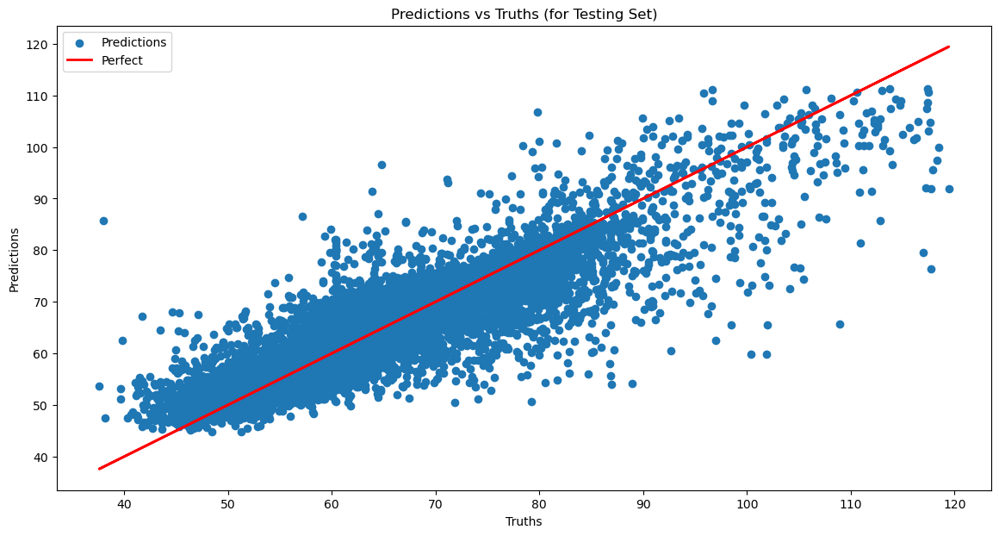

In [238]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Random Forest 

In [239]:
from sklearn.tree import DecisionTreeRegressor
model_acc = []
for depth in range(10,30,1):
    dtree_model_test  = DecisionTreeRegressor(max_depth=depth)
    dtree_model_test.fit(x_train, y_train) # train the model
    y_pred = dtree_model_test.predict(x_test) # perform prediction
# compute metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-----"+ str(depth) +"-----Depth:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("----------------------------")
# Optimal depth is 23

Performance-----10-----Depth:
Mean Squared Error: 33.907787938449594
R-squared: 0.7430172530646729
----------------------------
Performance-----11-----Depth:
Mean Squared Error: 34.26933070368018
R-squared: 0.7402771671259439
----------------------------
Performance-----12-----Depth:
Mean Squared Error: 33.63566843245831
R-squared: 0.7450796116671057
----------------------------
Performance-----13-----Depth:
Mean Squared Error: 33.48335743904151
R-squared: 0.7462339570212688
----------------------------
Performance-----14-----Depth:
Mean Squared Error: 33.977831365814836
R-squared: 0.7424864029720111
----------------------------
Performance-----15-----Depth:
Mean Squared Error: 34.39833035695511
R-squared: 0.7392994954089782
----------------------------
Performance-----16-----Depth:
Mean Squared Error: 35.08651187257928
R-squared: 0.7340838565534964
----------------------------
Performance-----17-----Depth:
Mean Squared Error: 36.14700969193037
R-squared: 0.7260464805019984
-----------

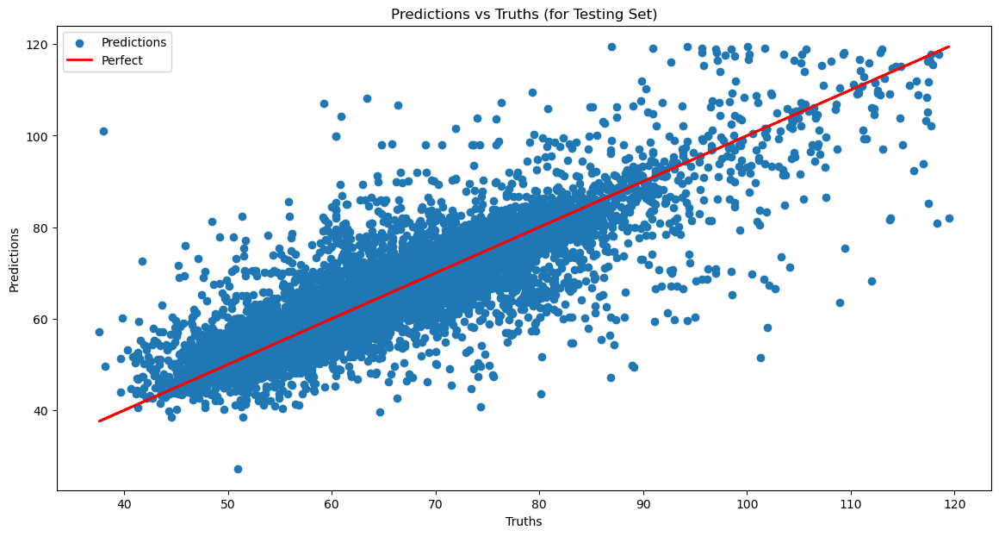

In [240]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

In [241]:
from sklearn.ensemble import RandomForestRegressor
model_acc = []
for estimator in range(20,50,5):
    dtree_model_test  = RandomForestRegressor(n_estimators=estimator)
    dtree_model_test.fit(x_train, y_train) # train the model
    y_pred = dtree_model_test.predict(x_test) # perform prediction
    # compute metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-----"+ str(estimator) +"-----estimators:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("----------------------------")
# Optimal estimator of 45

Performance-----20-----estimators:
Mean Squared Error: 18.4483774285152
R-squared: 0.8601821293478251
----------------------------
Performance-----25-----estimators:
Mean Squared Error: 18.24433496612254
R-squared: 0.8617285408262824
----------------------------
Performance-----30-----estimators:
Mean Squared Error: 18.079401266411878
R-squared: 0.8629785520417232
----------------------------
Performance-----35-----estimators:
Mean Squared Error: 17.685136026212007
R-squared: 0.8659666373934306
----------------------------
Performance-----40-----estimators:
Mean Squared Error: 17.785884515651937
R-squared: 0.8652030775996494
----------------------------
Performance-----45-----estimators:
Mean Squared Error: 17.449535136111223
R-squared: 0.8677522261209645
----------------------------


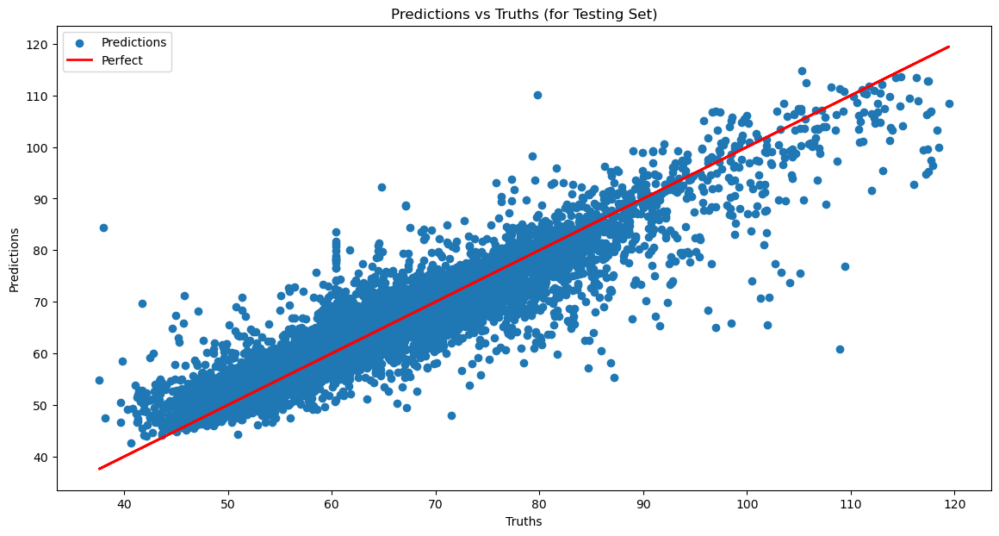

In [242]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### CatboostRegressor

In [244]:
from catboost import CatBoostRegressor
cbr = CatBoostRegressor(iterations=2000, depth = 8, learning_rate= 0.1, loss_function= 'RMSE')
kf = KFold(n_splits=folds, shuffle=True, random_state=42)
cbr.fit(X,Y) # train the model
# compute metrics
r2 = cross_val_score(cbr, X, Y, cv=kf, scoring='r2')
mse = cross_val_score(cbr, X, Y, cv=kf, scoring='neg_mean_squared_error')
print(f"Average Mean Squared Error: {np.mean(mse)}")
print(f"Average R-squared: {abs(np.mean(r2))}")
print("----------------------------")
# BEST score

0:	learn: 10.9920013	total: 33ms	remaining: 1m 6s
1:	learn: 10.3984412	total: 53.6ms	remaining: 53.5s
2:	learn: 9.8732274	total: 71.7ms	remaining: 47.7s
3:	learn: 9.4209216	total: 91.5ms	remaining: 45.7s
4:	learn: 9.0031376	total: 111ms	remaining: 44.3s
5:	learn: 8.6532773	total: 129ms	remaining: 43s
6:	learn: 8.3519808	total: 148ms	remaining: 42s
7:	learn: 8.0741082	total: 165ms	remaining: 41.1s
8:	learn: 7.8242450	total: 183ms	remaining: 40.5s
9:	learn: 7.6218036	total: 201ms	remaining: 40s
10:	learn: 7.4327273	total: 221ms	remaining: 40s
11:	learn: 7.2788091	total: 241ms	remaining: 39.9s
12:	learn: 7.1268119	total: 261ms	remaining: 39.9s
13:	learn: 6.9969780	total: 281ms	remaining: 39.9s
14:	learn: 6.8798820	total: 301ms	remaining: 39.8s
15:	learn: 6.7834947	total: 319ms	remaining: 39.5s
16:	learn: 6.6926013	total: 341ms	remaining: 39.8s
17:	learn: 6.6078223	total: 359ms	remaining: 39.5s
18:	learn: 6.5336431	total: 377ms	remaining: 39.3s
19:	learn: 6.4656774	total: 396ms	remaining: 

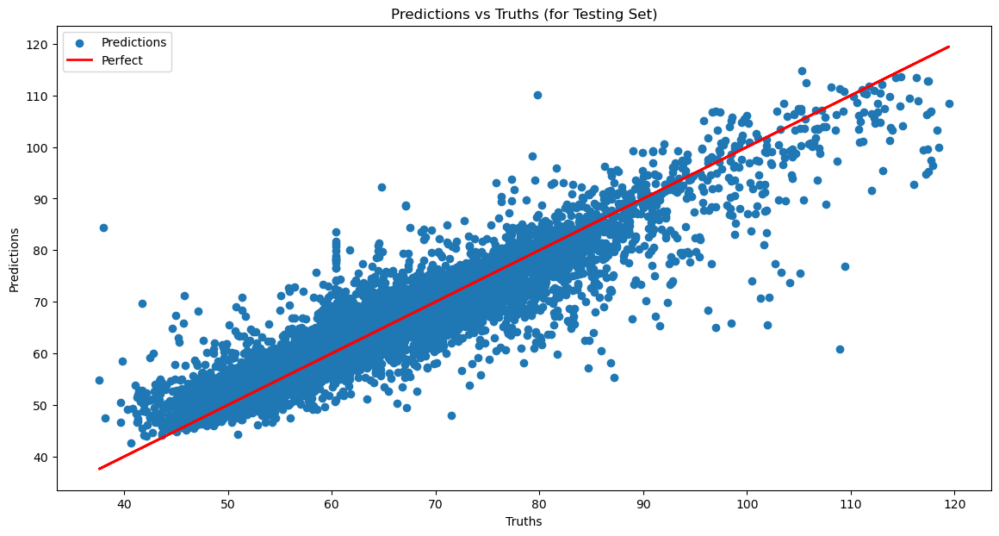

In [245]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

## Run Final Test on no outlier Data using Z Scores

In [246]:
from sklearn.preprocessing import StandardScaler

#normalize the data
scaler = StandardScaler()
normalized = scaler.fit_transform(data)
#calculate teh z_score
z_scores = np.abs((normalized - np.mean(normalized, axis=0)) / np.std(normalized, axis=0))
threshold = 3
outliers = np.where(z_scores > threshold)

# Drop outliers 
no_outliers = combined_df[(z_scores <= threshold).all(axis=1)]
no_outliers

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...
36724,4.3528,1029.2,87.147,4.9960,34.094,1100.0,527.73,167.04,14.378,1.76180,47.370
36725,3.7675,1029.0,89.609,5.0733,33.402,1099.8,529.82,165.78,14.205,1.93560,47.819
36726,3.4218,1028.7,91.003,3.6911,22.859,1073.5,549.78,129.86,11.549,3.67380,67.737
36727,3.3776,1028.5,92.703,3.3128,20.248,1057.6,550.30,117.46,10.783,5.34880,66.550


### CO prediction on outlier cleared

### Simple Linear Regression

In [247]:
# Now let's perform simple linear regression
# for CO prediction
X = no_outliers.values[:,:-2] #independent
Y = no_outliers.values[:,-2] #target
print(f'Shape of X {X.shape}')
print(f'Shape of Y {Y.shape}')


Shape of X (35058, 9)
Shape of Y (35058,)


In [248]:
# split the data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X,Y, train_size=0.7, random_state=42)
print("X-train shape: ", x_train.shape)
print("y-train shape: ",y_train.shape)
print("X-test shape: ", x_test.shape)
print("y-test shape: ", y_test.shape)

X-train shape:  (24540, 9)
y-train shape:  (24540,)
X-test shape:  (10518, 9)
y-test shape:  (10518,)


In [249]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
from sklearn.model_selection import cross_val_score, KFold
folds =5 # for a 5-fold validation
lr = LinearRegression()

kf = KFold(n_splits=folds, shuffle=True, random_state=42)
lr.fit(X,Y) # train the model
# compute metrics
r2 = cross_val_score(lr, X, Y, cv=kf, scoring='r2')
rmse = cross_val_score(lr, X, Y, cv=kf, scoring='neg_mean_squared_error')

print("Performance:")
print(f"Average Mean Squared Error: {np.mean(rmse)}")
print(f"Average R-squared: {abs(np.mean(r2))}")


Performance:
Average Mean Squared Error: -0.9189204465950176
Average R-squared: 0.6168675516515123


In [250]:
y_pred = lr.predict(x_test) 

In [251]:
y_test_list = list(y_test)
for i in range(y_pred.shape[0]):
    if (y_test_list[i]) != y_pred[i]:
       print("Error in testing instance( sample)", i," actual = ",y_test_list[i], "predicted = ", y_pred[i])

Error in testing instance( sample) 0  actual =  2.8126 predicted =  3.792414786876094
Error in testing instance( sample) 1  actual =  1.2274 predicted =  1.2997685148240663
Error in testing instance( sample) 2  actual =  1.4828 predicted =  1.2653653481762035
Error in testing instance( sample) 3  actual =  1.2385 predicted =  1.6018355944338794
Error in testing instance( sample) 4  actual =  2.0434 predicted =  3.442876312489176
Error in testing instance( sample) 5  actual =  0.50982 predicted =  1.2382277336366911
Error in testing instance( sample) 6  actual =  1.5647 predicted =  1.7020029837171933
Error in testing instance( sample) 7  actual =  1.3159 predicted =  1.3467902413350714
Error in testing instance( sample) 8  actual =  1.1738 predicted =  1.9198848130087782
Error in testing instance( sample) 9  actual =  2.3133 predicted =  2.0511479130903467
Error in testing instance( sample) 10  actual =  1.7642 predicted =  1.782955805342155
Error in testing instance( sample) 11  actua

In [252]:
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Performance:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

print("Testing set score: {:.2f}".format(lr.score(x_train, y_train)))


Performance:
Mean Squared Error: 0.9223115279142413
R-squared: 0.6188639805949245
Testing set score: 0.62


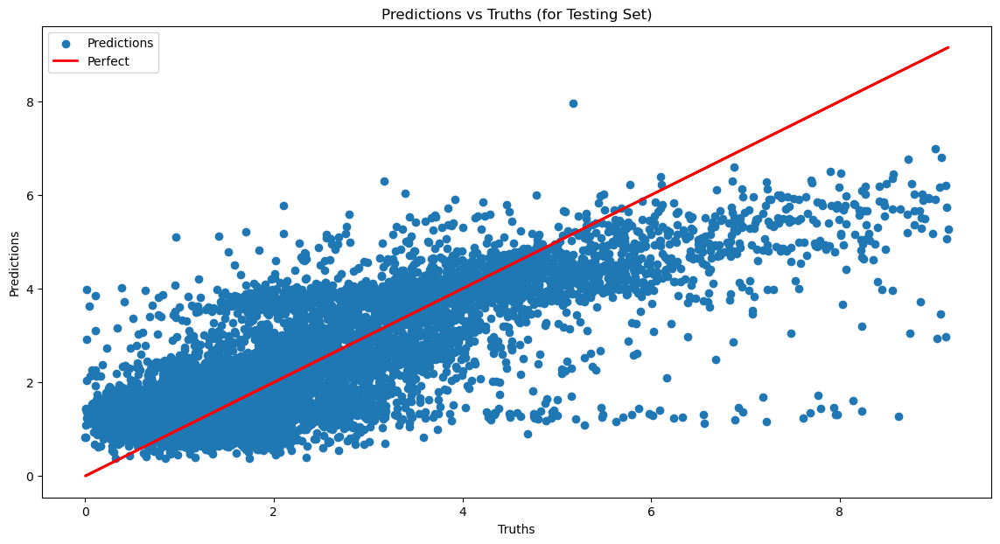

In [253]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Ridge Regression


In [254]:
from sklearn.linear_model import Ridge
alphas = [0.0001, 0.001, 0.01]
ridge_models = []
for al in alphas:
    ridge= Ridge(alpha=al)
    ridge.fit(x_train, y_train)# train the model

    y_pred = ridge.predict(x_test)
    # compute metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance for alpha =" + str(al))
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    ridge_models.append(ridge)
print("Testing set score: {:.2f}".format(ridge.score(x_train, y_train)))


Performance for alpha =0.0001
Mean Squared Error: 0.9226335418790851
R-squared: 0.6187309115428321
Performance for alpha =0.001
Mean Squared Error: 0.9226335617321902
R-squared: 0.6187309033387349
Performance for alpha =0.01
Mean Squared Error: 0.9226337602818983
R-squared: 0.6187308212900529
Testing set score: 0.62


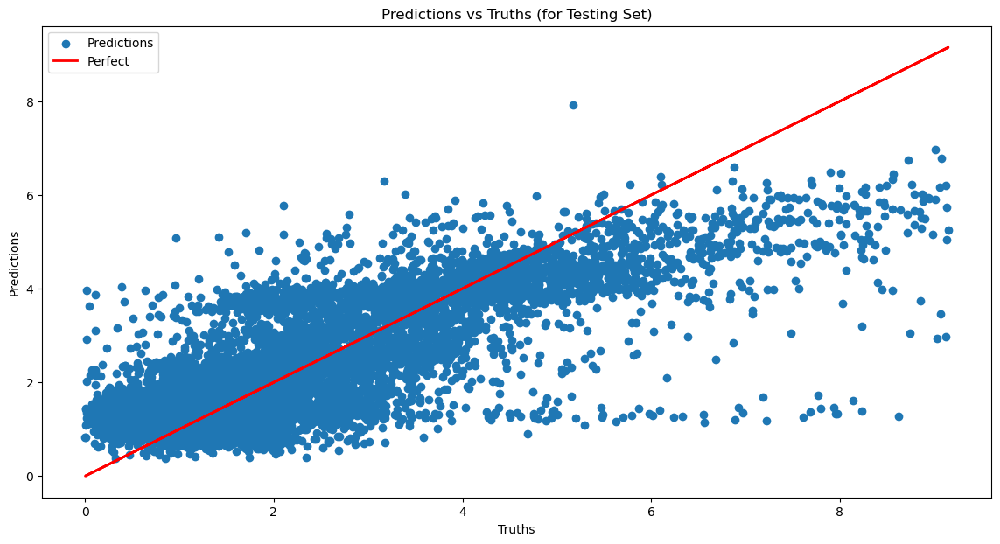

In [255]:
# Visualize fitted line
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Lasso Regression

In [256]:
from sklearn.linear_model import Lasso
alphas = [0.0001, 0.001, 0.01]
ridge_models = []
for al in alphas:
    ridge= Lasso(alpha=al)
    ridge.fit(x_train, y_train)# train the model
    y_pred = ridge.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-------------:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    ridge_models.append(ridge)
print("Testing set score: {:.2f}".format(ridge.score(x_train, y_train)))

c:\Users\Natnael Abule\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.393e+03, tolerance: 5.865e+00
  model = cd_fast.enet_coordinate_descent(


Performance-------------:
Mean Squared Error: 0.9227060032870256
R-squared: 0.6187009675903312
Performance-------------:
Mean Squared Error: 0.923469642024162
R-squared: 0.6183854015156083
Performance-------------:
Mean Squared Error: 0.9318928252326097
R-squared: 0.6149046052535823
Testing set score: 0.61


c:\Users\Natnael Abule\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.941e+02, tolerance: 5.865e+00
  model = cd_fast.enet_coordinate_descent(


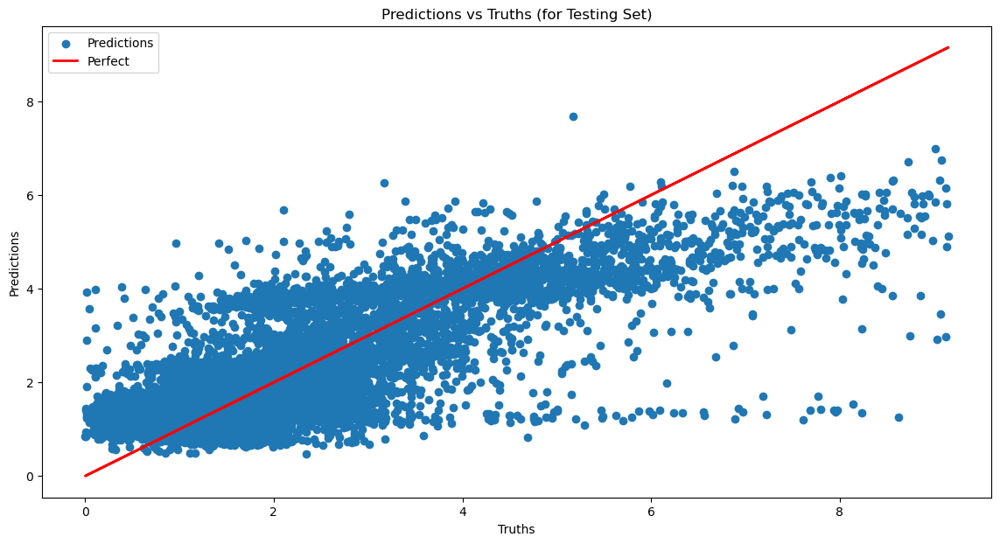

In [257]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

Variable (Abbr.) Unit Min Max Mean
Ambient temperature (AT) C â€“6.23 37.10 17.71
Ambient pressure (AP) mbar 985.85 1036.56 1013.07
Ambient humidity (AH) (%) 24.08 100.20 77.87
Air filter difference pressure (AFDP) mbar 2.09 7.61 3.93
Gas turbine exhaust pressure (GTEP) mbar 17.70 40.72 25.56
Turbine inlet temperature (TIT) C 1000.85 1100.89 1081.43
Turbine after temperature (TAT) C 511.04 550.61 546.16
Compressor discharge pressure (CDP) mbar 9.85 15.16 12.06
Turbine energy yield (TEY) MWH 100.02 179.50 133.51
Carbon monoxide (CO) mg/m3 0.00 44.10 2.37
Nitrogen oxides (NOx) mg/m3 25.90 119.91 65.29

### KNN Classifier


In [258]:
from sklearn.neighbors import KNeighborsRegressor
for i in range(3,12,2):
    knn = KNeighborsRegressor(n_neighbors=i)
    knn.fit(x_train, y_train)
    y_pred = knn.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-----"+ str(i) +"-----Neighbours:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("----------------------------")

Performance-----3-----Neighbours:
Mean Squared Error: 0.6675888508281113
R-squared: 0.7241255806709448
----------------------------
Performance-----5-----Neighbours:
Mean Squared Error: 0.6357644385336999
R-squared: 0.7372767009320434
----------------------------
Performance-----7-----Neighbours:
Mean Squared Error: 0.6330254464767262
R-squared: 0.7384085620203873
----------------------------
Performance-----9-----Neighbours:
Mean Squared Error: 0.6331207097588515
R-squared: 0.738369195421309
----------------------------
Performance-----11-----Neighbours:
Mean Squared Error: 0.6348159315223644
R-squared: 0.7376686619731201
----------------------------


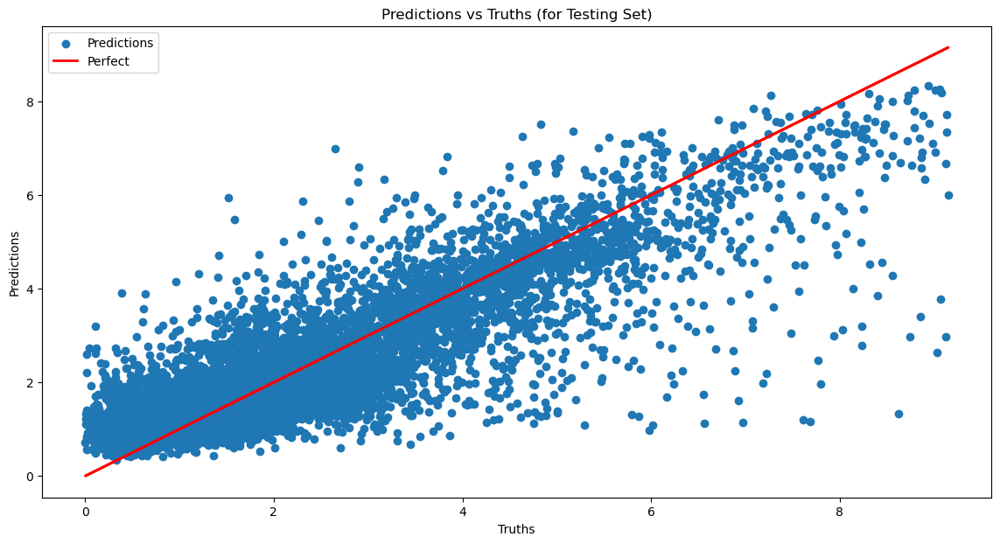

In [259]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Decision Tree  

In [260]:
from sklearn.tree import DecisionTreeRegressor
model_acc = []
for depth in range(10,30,1):
    dtree_model_test  = DecisionTreeRegressor(max_depth=depth)
    dtree_model_test.fit(x_train, y_train)
    y_pred = dtree_model_test.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-----"+ str(depth) +"-----Depth:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("----------------------------")

Performance-----10-----Depth:
Mean Squared Error: 0.6511659144218658
R-squared: 0.7309121949757387
----------------------------
Performance-----11-----Depth:
Mean Squared Error: 0.6604287889828131
R-squared: 0.7270844046559193
----------------------------
Performance-----12-----Depth:
Mean Squared Error: 0.6828844707383755
R-squared: 0.7178048186393624
----------------------------
Performance-----13-----Depth:
Mean Squared Error: 0.7194945851302772
R-squared: 0.7026760548247661
----------------------------
Performance-----14-----Depth:
Mean Squared Error: 0.7589656012394475
R-squared: 0.6863650519733288
----------------------------
Performance-----15-----Depth:
Mean Squared Error: 0.7755933803476482
R-squared: 0.6794937884695772
----------------------------
Performance-----16-----Depth:
Mean Squared Error: 0.8057566699963039
R-squared: 0.667029110537112
----------------------------
Performance-----17-----Depth:
Mean Squared Error: 0.8070581740944972
R-squared: 0.6664912769784807
------

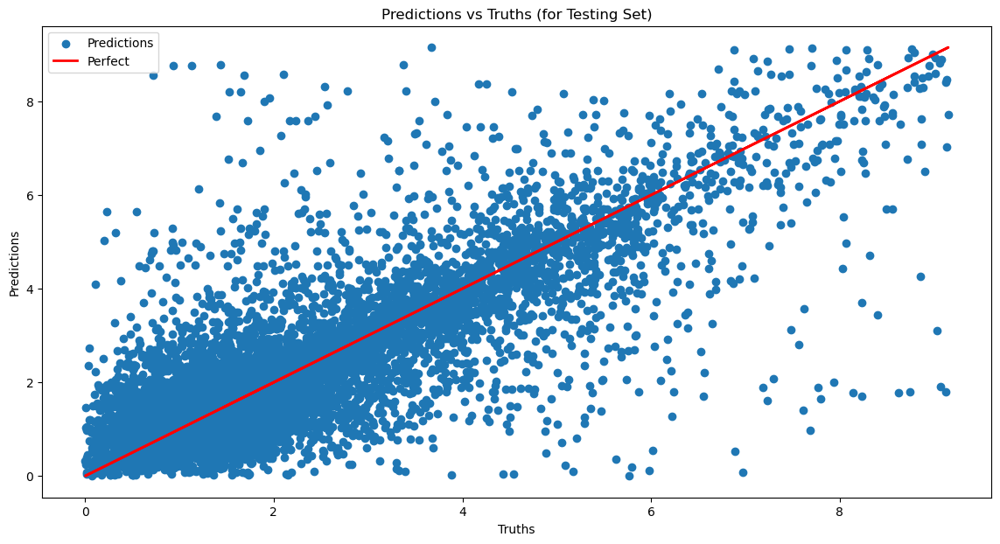

In [261]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Random forest

In [262]:
from sklearn.ensemble import RandomForestRegressor
dtree_model_test  = RandomForestRegressor(n_estimators=40)
dtree_model_test.fit(x_train, y_train)
y_pred = dtree_model_test.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Performance-----"+ str(estimator) +"-----estimators:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")
print("----------------------------")

Performance-----45-----estimators:
Mean Squared Error: 0.48215468813102236
R-squared: 0.8007543947896524
----------------------------


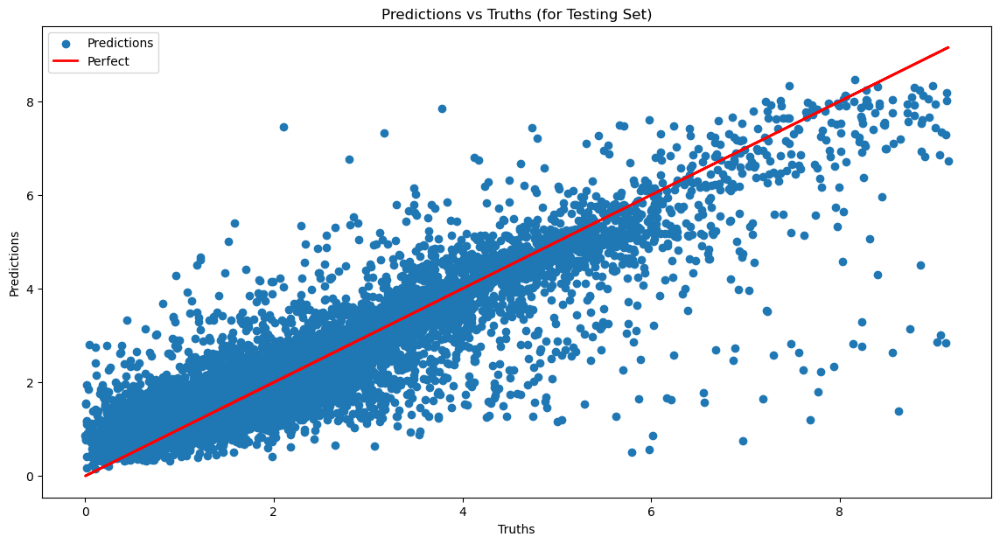

In [263]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### CatboostRegressor

In [264]:
from catboost import CatBoostRegressor
cbr = CatBoostRegressor(iterations=2000, depth = 8, learning_rate= 0.1, loss_function= 'RMSE')
cbr.fit(x_train,y_train)
y_pred = cbr.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")
print("----------------------------")

0:	learn: 1.4457789	total: 18.7ms	remaining: 37.4s
1:	learn: 1.3573240	total: 36.3ms	remaining: 36.3s
2:	learn: 1.2816551	total: 53.4ms	remaining: 35.6s
3:	learn: 1.2148199	total: 71.7ms	remaining: 35.8s
4:	learn: 1.1573096	total: 89.1ms	remaining: 35.5s
5:	learn: 1.1060855	total: 106ms	remaining: 35.2s
6:	learn: 1.0630830	total: 124ms	remaining: 35.3s
7:	learn: 1.0255322	total: 142ms	remaining: 35.3s
8:	learn: 0.9931385	total: 160ms	remaining: 35.3s
9:	learn: 0.9647910	total: 176ms	remaining: 35s
10:	learn: 0.9407825	total: 194ms	remaining: 35s
11:	learn: 0.9210417	total: 210ms	remaining: 34.8s
12:	learn: 0.9040294	total: 227ms	remaining: 34.7s
13:	learn: 0.8887483	total: 244ms	remaining: 34.6s
14:	learn: 0.8758243	total: 261ms	remaining: 34.5s
15:	learn: 0.8632678	total: 277ms	remaining: 34.4s
16:	learn: 0.8539297	total: 294ms	remaining: 34.3s
17:	learn: 0.8448005	total: 311ms	remaining: 34.2s
18:	learn: 0.8380254	total: 327ms	remaining: 34.1s
19:	learn: 0.8319139	total: 343ms	remain

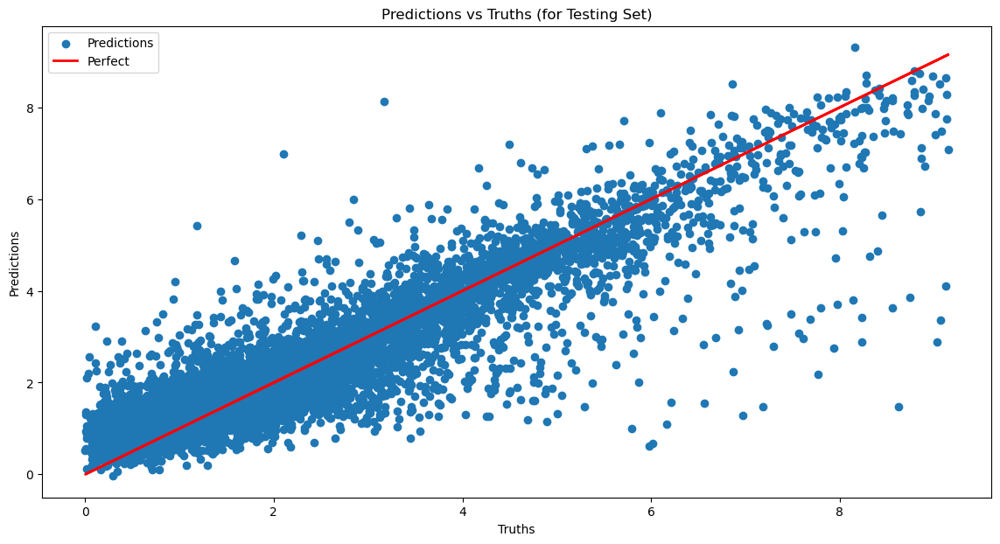

In [265]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### NOx predicition on outlier cleared

### Simple Linear Regression

We are going to use k-fold cross validation to prevent overfitting and provide a more robust estimate of the model performance


In [266]:
# Now let's perform simple linear regression
# for CO prediction
X = no_outliers.values[:,:-2] #independent
Y = no_outliers.values[:,-1] #target
print(f'Shape of X {X.shape}')
print(f'Shape of Y {Y.shape}')


Shape of X (35058, 9)
Shape of Y (35058,)


In [267]:
# split the data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X,Y, train_size=0.7, random_state=42)
print("X-train shape: ", x_train.shape)
print("y-train shape: ",y_train.shape)
print("X-test shape: ", x_test.shape)
print("y-test shape: ", y_test.shape)

X-train shape:  (24540, 9)
y-train shape:  (24540,)
X-test shape:  (10518, 9)
y-test shape:  (10518,)


In [268]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
from sklearn.model_selection import cross_val_score, KFold
folds =5 # for a 5-fold validation
lr = LinearRegression()

kf = KFold(n_splits=folds, shuffle=True, random_state=42)
lr.fit(X,Y)
r2 = cross_val_score(lr, X, Y, cv=kf, scoring='r2')
rmse = cross_val_score(lr, X, Y, cv=kf, scoring='neg_mean_squared_error')

print("Performance:")
print(f"Average Mean Squared Error: {np.mean(rmse)}")
print(f"Average R-squared: {abs(np.mean(r2))}")


Performance:
Average Mean Squared Error: -45.47027205866972
Average R-squared: 0.5659580879074415


In [269]:
y_pred = lr.predict(x_test) 

In [270]:
y_test_list = list(y_test)
for i in range(y_pred.shape[0]):
    if (y_test_list[i]) != y_pred[i]:
       print("Error in testing instance( sample)", i," actual = ",y_test_list[i], "predicted = ", y_pred[i])

Error in testing instance( sample) 0  actual =  56.582 predicted =  63.8687425172908
Error in testing instance( sample) 1  actual =  72.402 predicted =  64.71955141747924
Error in testing instance( sample) 2  actual =  55.276 predicted =  52.03250398840805
Error in testing instance( sample) 3  actual =  74.064 predicted =  73.6860346999913
Error in testing instance( sample) 4  actual =  52.266 predicted =  61.59289758856846
Error in testing instance( sample) 5  actual =  63.855 predicted =  62.98661572110234
Error in testing instance( sample) 6  actual =  73.143 predicted =  72.23544979756855
Error in testing instance( sample) 7  actual =  57.189 predicted =  60.119561859279884
Error in testing instance( sample) 8  actual =  63.818 predicted =  61.75404048880944
Error in testing instance( sample) 9  actual =  55.746 predicted =  52.3726016330894
Error in testing instance( sample) 10  actual =  63.257 predicted =  59.82394498391659
Error in testing instance( sample) 11  actual =  59.33 

 6385  actual =  74.57 predicted =  71.10395215497874
Error in testing instance( sample) 6386  actual =  71.957 predicted =  69.23700409011212
Error in testing instance( sample) 6387  actual =  68.212 predicted =  71.22238289482027
Error in testing instance( sample) 6388  actual =  60.089 predicted =  64.39997873748939
Error in testing instance( sample) 6389  actual =  62.299 predicted =  61.82374283815909
Error in testing instance( sample) 6390  actual =  74.631 predicted =  73.19999788322741
Error in testing instance( sample) 6391  actual =  60.474 predicted =  63.042775959537835
Error in testing instance( sample) 6392  actual =  60.335 predicted =  65.53092131282347
Error in testing instance( sample) 6393  actual =  58.679 predicted =  58.96362341374174
Error in testing instance( sample) 6394  actual =  63.876 predicted =  70.07611559193356
Error in testing instance( sample) 6395  actual =  74.455 predicted =  76.0429559718649
Error in testing instance( sample) 6396  actual =  61.21

In [271]:
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Performance:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

print("Testing set score: {:.2f}".format(lr.score(x_train, y_train)))


Performance:
Mean Squared Error: 46.51846877348155
R-squared: 0.5594295972357939
Testing set score: 0.57


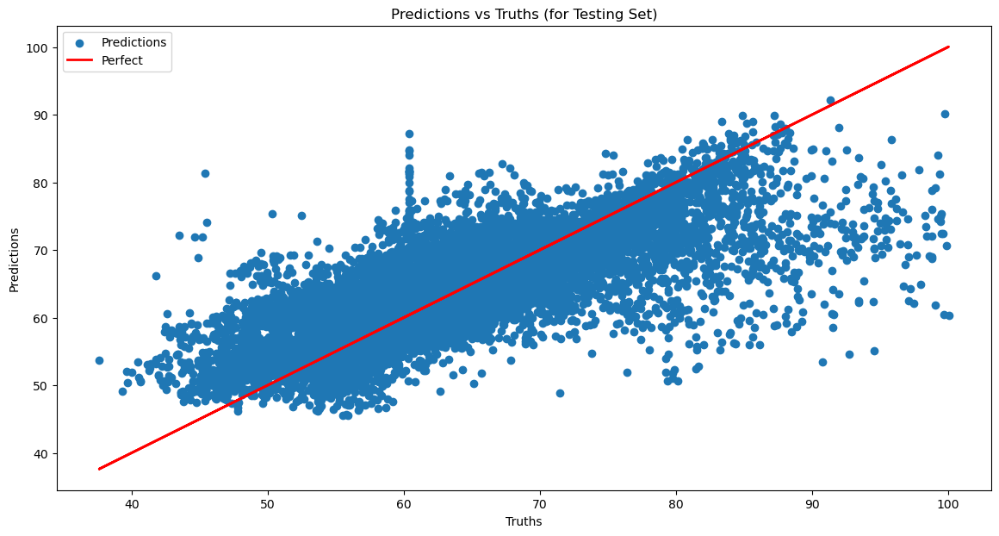

In [272]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Ridge Regression


In [273]:
from sklearn.linear_model import Ridge
alphas = [0.0001, 0.001, 0.01]
ridge_models = []
for al in alphas:
    ridge= Ridge(alpha=al)
    ridge.fit(x_train, y_train)
    y_pred = ridge.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance for alpha =" + str(al))
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    ridge_models.append(ridge)
print("Testing set score: {:.2f}".format(ridge.score(x_train, y_train)))


Performance for alpha =0.0001
Mean Squared Error: 46.567631528484796
R-squared: 0.5589639831400623
Performance for alpha =0.001
Mean Squared Error: 46.56763095933897
R-squared: 0.5589639885303689
Performance for alpha =0.01
Mean Squared Error: 46.5676252702422
R-squared: 0.5589640424110688
Testing set score: 0.57


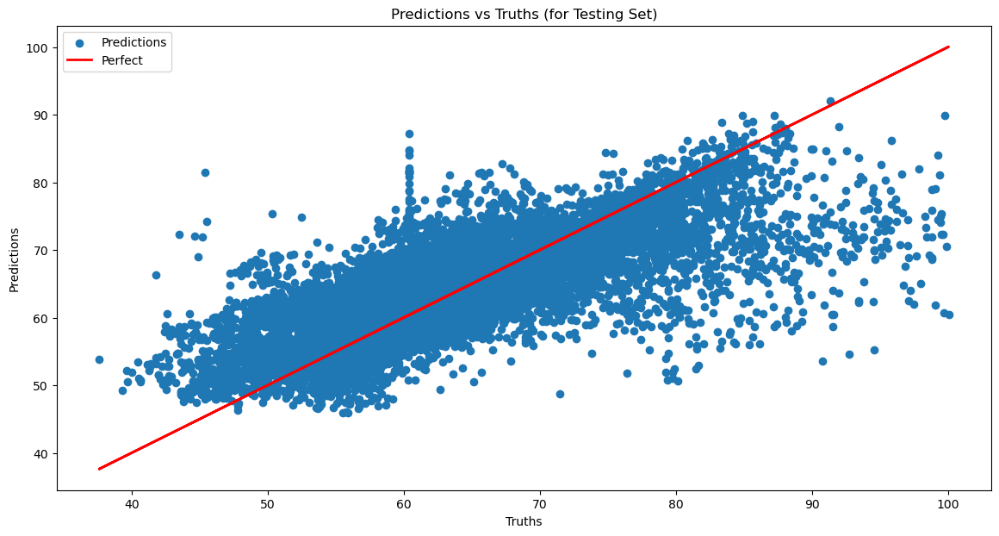

In [274]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Lasso Regression

In [275]:
from sklearn.linear_model import Lasso
alphas = [0.0001, 0.001, 0.01]
ridge_models = []
for al in alphas:
    ridge= Lasso(alpha=al)
    ridge.fit(x_train, y_train)
    y_pred = ridge.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-------------:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    ridge_models.append(ridge)
print("Testing set score: {:.2f}".format(ridge.score(x_train, y_train)))

c:\Users\Natnael Abule\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.267e+05, tolerance: 2.563e+02
  model = cd_fast.enet_coordinate_descent(


Performance-------------:
Mean Squared Error: 46.56580346654663
R-squared: 0.5589812964783043


c:\Users\Natnael Abule\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.741e+05, tolerance: 2.563e+02
  model = cd_fast.enet_coordinate_descent(


Performance-------------:
Mean Squared Error: 46.5650149129436
R-squared: 0.5589887647675161
Performance-------------:
Mean Squared Error: 46.57506064616047
R-squared: 0.558893622927165
Testing set score: 0.57


c:\Users\Natnael Abule\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.086e+03, tolerance: 2.563e+02
  model = cd_fast.enet_coordinate_descent(


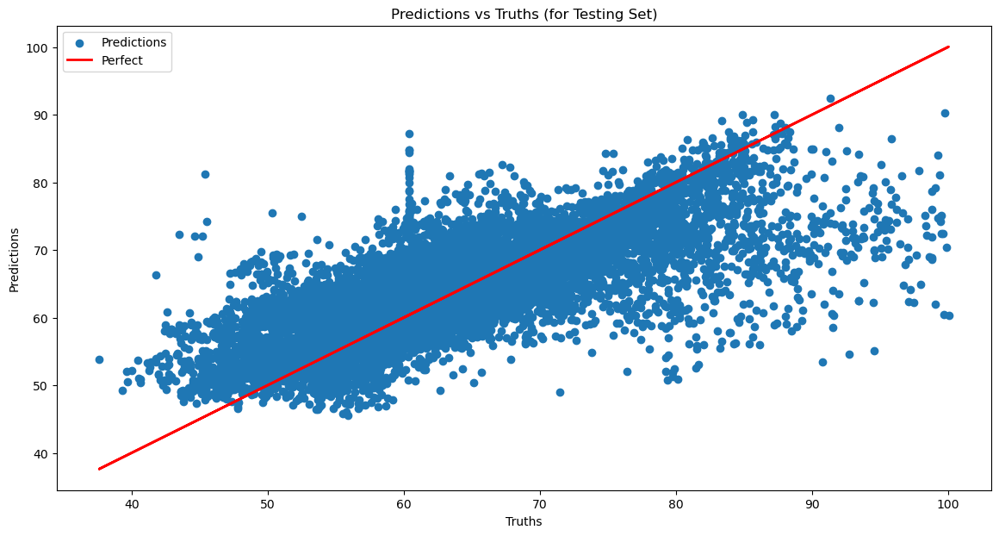

In [276]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### KNN Classifier


In [277]:
from sklearn.neighbors import KNeighborsRegressor
for i in range(3,12,2):
    knn = KNeighborsRegressor(n_neighbors=i)
    knn.fit(x_train, y_train)
    y_pred = knn.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Performance-----"+ str(i) +"-----Neighbours:")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r2}")
    print("----------------------------")

Performance-----3-----Neighbours:
Mean Squared Error: 24.822552620956667
R-squared: 0.7649088137637747
----------------------------
Performance-----5-----Neighbours:
Mean Squared Error: 24.498627169378214
R-squared: 0.767976669831059
----------------------------
Performance-----7-----Neighbours:
Mean Squared Error: 25.43267520124878
R-squared: 0.7591304216966638
----------------------------
Performance-----9-----Neighbours:
Mean Squared Error: 26.047306135459728
R-squared: 0.7533093315925324
----------------------------
Performance-----11-----Neighbours:
Mean Squared Error: 26.556478476412728
R-squared: 0.7484870261890078
----------------------------


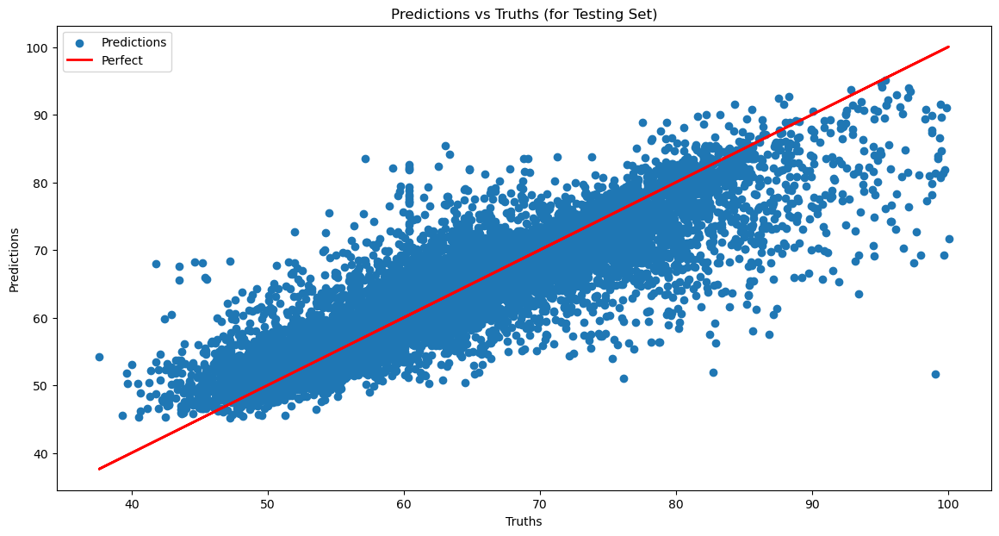

In [278]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Decision Tree

In [279]:
from sklearn.tree import DecisionTreeRegressor
dtree_model_test  = DecisionTreeRegressor(max_depth=13)
dtree_model_test.fit(x_train, y_train)
y_pred = dtree_model_test.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Performance-----"+ str(depth) +"-----Depth:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")
print("----------------------------")

Performance-----29-----Depth:
Mean Squared Error: 27.681951410438614
R-squared: 0.7378278175581625
----------------------------


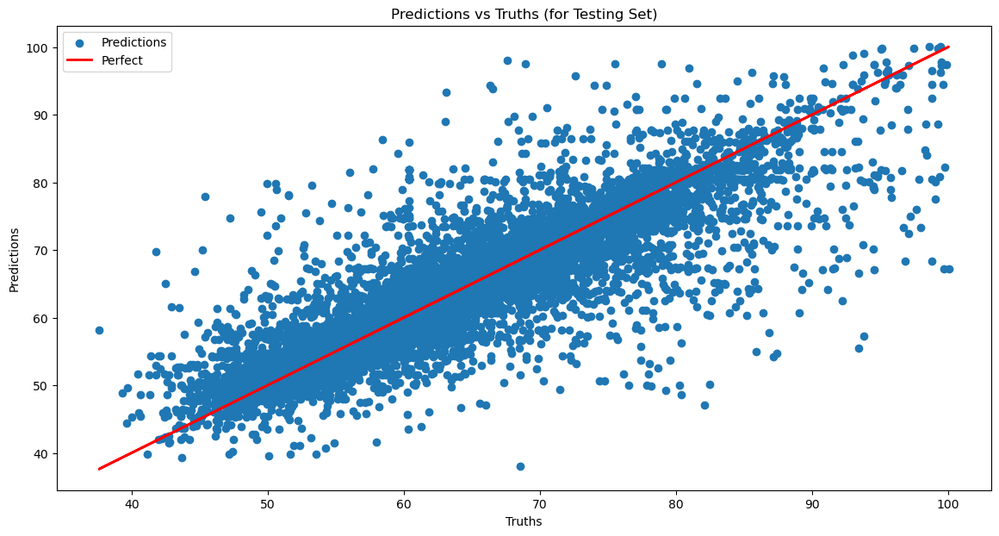

In [280]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Random Forest

In [281]:
from sklearn.ensemble import RandomForestRegressor
dtree_model_test  = RandomForestRegressor(n_estimators=40)
dtree_model_test.fit(x_train, y_train)
y_pred = dtree_model_test.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Performance-----"+ str(estimator) +"-----estimators:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")
print("----------------------------")

Performance-----45-----estimators:
Mean Squared Error: 15.484317946152547
R-squared: 0.8533500269047036
----------------------------


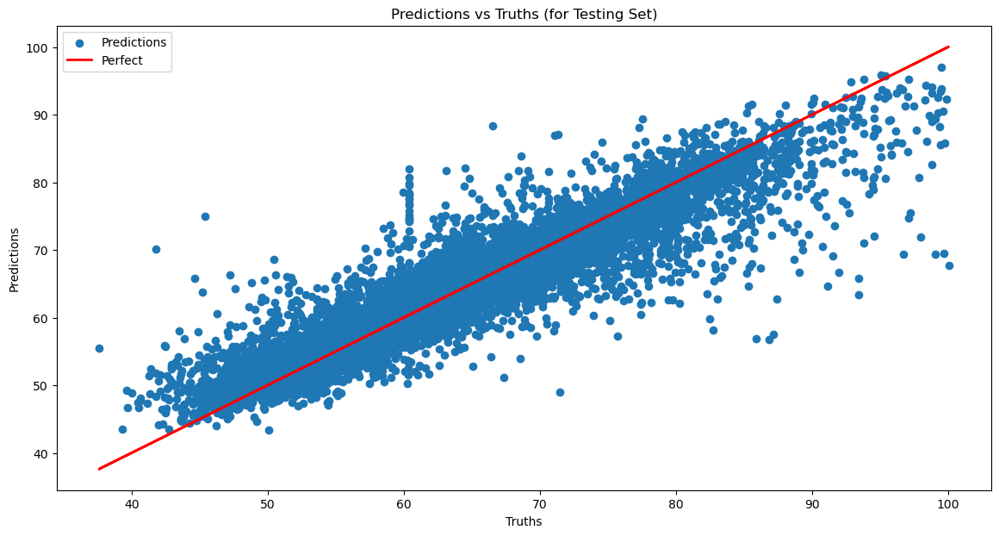

In [282]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")

### Catboost regressor

In [285]:
from catboost import CatBoostRegressor
cbr = CatBoostRegressor(iterations=2000, depth = 8, learning_rate= 0.1, loss_function= 'RMSE')
kf = KFold(n_splits=folds, shuffle=True, random_state=42)
cbr.fit(X,Y)
r2 = cross_val_score(cbr, X, Y, cv=kf, scoring='r2')
mse = cross_val_score(cbr, X, Y, cv=kf, scoring='neg_mean_squared_error')
print(f"Average Mean Squared Error: {abs(np.mean(mse))}")
print(f"Average R-squared: {abs(np.mean(r2))}")
print("----------------------------")

0:	learn: 9.6628182	total: 12.1ms	remaining: 24.1s
1:	learn: 9.1658021	total: 22.9ms	remaining: 22.9s
2:	learn: 8.7343275	total: 33.7ms	remaining: 22.4s
3:	learn: 8.3465145	total: 44.4ms	remaining: 22.2s
4:	learn: 8.0209672	total: 54.4ms	remaining: 21.7s
5:	learn: 7.7236352	total: 64.4ms	remaining: 21.4s
6:	learn: 7.4735172	total: 73.6ms	remaining: 21s
7:	learn: 7.2519691	total: 83.2ms	remaining: 20.7s
8:	learn: 7.0497789	total: 92.9ms	remaining: 20.5s
9:	learn: 6.8820840	total: 103ms	remaining: 20.4s
10:	learn: 6.7332730	total: 112ms	remaining: 20.3s
11:	learn: 6.6094941	total: 121ms	remaining: 20.1s
12:	learn: 6.4932540	total: 133ms	remaining: 20.3s
13:	learn: 6.3870242	total: 143ms	remaining: 20.3s
14:	learn: 6.2880392	total: 153ms	remaining: 20.3s
15:	learn: 6.2092909	total: 164ms	remaining: 20.4s
16:	learn: 6.1309890	total: 174ms	remaining: 20.3s
17:	learn: 6.0640684	total: 185ms	remaining: 20.3s
18:	learn: 6.0000629	total: 195ms	remaining: 20.3s
19:	learn: 5.9400770	total: 206ms	

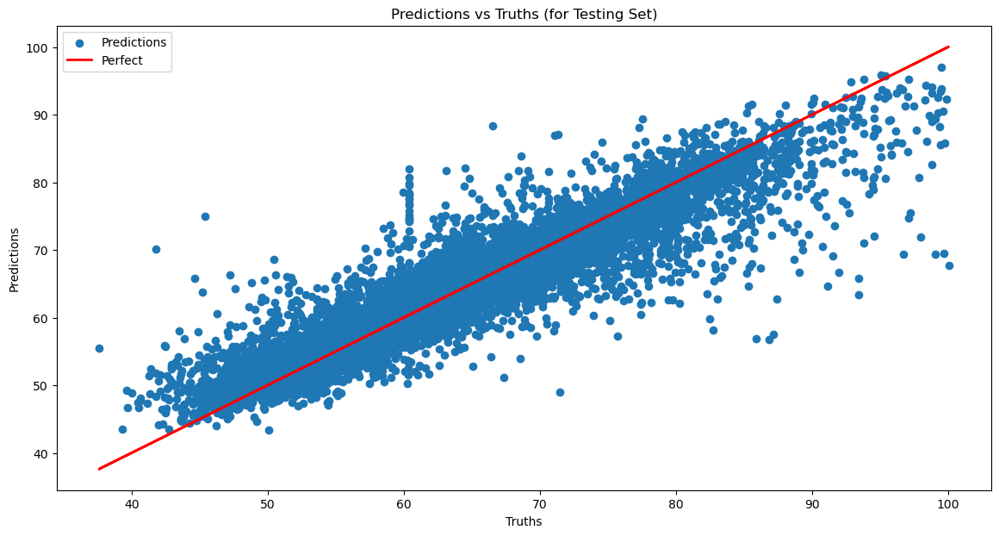

In [284]:
plt.scatter(y_test, y_pred, label='Predictions')
plt.plot(y_test, y_test, color='red', linewidth=2, label='Perfect')
plt.title('Predictions vs Truths (for Testing Set)')
plt.xlabel('Truths')
plt.ylabel('Predictions')
_=plt.legend(loc="upper left")